<a href="https://colab.research.google.com/github/cxbxmxcx/Practical_AI_on_GCP/blob/master/Chapter_6_Action_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install the necessary python packages.
!pip install -q "tensorflow==1.15" "tensorflow-hub" "imageio"
!pip install --upgrade youtube_dl

     |████████████████████████████████| 412.3MB 36kB/s 
     |████████████████████████████████| 512kB 53.2MB/s 
     |████████████████████████████████| 3.8MB 60.6MB/s 
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
     |████████████████████████████████| 1.8MB 9.5MB/s 


In [2]:
from __future__ import unicode_literals
import youtube_dl
from absl import logging

import tensorflow as tf
import tensorflow_hub as hub

logging.set_verbosity(logging.ERROR)

# Some modules to help with reading the UCF101 dataset.
import random
import re
import os
import tempfile
import cv2
import numpy as np

# Some modules to display an animation using imageio.
import imageio
from IPython import display

from urllib import request  # requires python3

In [3]:
video_url = 'https://www.youtube.com/watch?v=lUVlSwQ9tSU'

download_options = {}
download = youtube_dl.YoutubeDL(download_options)
info_dict = download.extract_info(video_url, download=False)
formats = info_dict.get('formats',None)

for f in formats:    
  if f.get('format_note',None) == '144p':        
    url = f.get('url',None)  

print(url)

[youtube] lUVlSwQ9tSU: Downloading webpage
https://r3---sn-5hnekn7k.googlevideo.com/videoplayback?expire=1593234914&ei=goH2Xs_HNuqC6dsP_N2g-AU&ip=34.91.233.165&id=o-AHd5BUAzrv-dsoOB9xuLjlCgVu0HMSvtUfQc-BrXDEJ4&itag=160&aitags=133%2C134%2C135%2C136%2C160%2C242%2C243%2C244%2C247%2C278&source=youtube&requiressl=yes&mh=3W&mm=31%2C26&mn=sn-5hnekn7k%2Csn-5go7yne6&ms=au%2Conr&mv=m&mvi=2&pl=20&initcwndbps=30540000&vprv=1&mime=video%2Fmp4&gir=yes&clen=366486&dur=30.830&lmt=1537214972176320&mt=1593213210&fvip=3&keepalive=yes&c=WEB&sparams=expire%2Cei%2Cip%2Cid%2Caitags%2Csource%2Crequiressl%2Cvprv%2Cmime%2Cgir%2Cclen%2Cdur%2Clmt&sig=AOq0QJ8wRgIhAJll_C2zchQGkDiPAuEIA3rnAGhrM-jH7CT7pQ-JD9vYAiEAusKZ78UUtGahPt2ZYrfO0azzlWrWDGG-exIG1ryqvNk%3D&lsparams=mh%2Cmm%2Cmn%2Cms%2Cmv%2Cmvi%2Cpl%2Cinitcwndbps&lsig=AG3C_xAwRQIhAJmv4lwkp8vi-RJaoYcIQyqkNhIBEwyTm_MDimXfio6SAiBxJvbvVWvrMiWJe3D_g-F1oSNiR5h_RxBpgZKO5_E3Yw%3D%3D&ratebypass=yes


In [4]:
# Utilities to open video files using CV2
def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]

def load_video(path, max_frames=0, resize=(224, 224)):
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)
      
      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

def animate(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, fps=25)
  with open('./animation.gif','rb') as f:
      display.display(display.Image(data=f.read(), height=300))

In [5]:
# Get the kinetics-400 action labels from the GitHub repository.
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map.txt"
with request.urlopen(KINETICS_URL) as obj:
  labels = [line.decode("utf-8").strip() for line in obj.readlines()]
print("Found %d labels." % len(labels))

Found 400 labels.


sample_video is a numpy array of shape (250, 224, 224, 3).


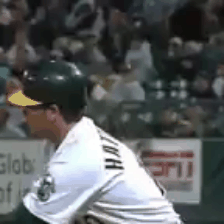

In [6]:
# Get a sample cricket video.
sample_video = load_video(url, max_frames=250)

print("sample_video is a numpy array of shape %s." % str(sample_video.shape))
animate(sample_video)

In [7]:
!ls

animation.gif  sample_data


In [8]:
# Run the i3d model on the video and print the top 5 actions.

# First add an empty dimension to the sample video as the model takes as input
# a batch of videos.
model_input = np.expand_dims(sample_video, axis=0)

# Create the i3d model and get the action probabilities.
with tf.Graph().as_default():
  i3d = hub.Module("https://tfhub.dev/deepmind/i3d-kinetics-400/1")
  input_placeholder = tf.placeholder(shape=(None, None, 224, 224, 3), dtype=tf.float32)
  logits = i3d(input_placeholder)
  probabilities = tf.nn.softmax(logits)
  with tf.train.MonitoredSession() as session:
    [ps] = session.run(probabilities,
                       feed_dict={input_placeholder: model_input})

print("Top 5 actions:")
for i in np.argsort(ps)[::-1][:5]:
  print("%-22s %.2f%%" % (labels[i], ps[i] * 100))

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


Top 5 actions:
hitting baseball       96.65%
catching or throwing baseball 1.74%
playing cricket        1.60%
catching or throwing softball 0.01%
playing kickball       0.00%
